In [1]:
# Importing the required libraries 

import pandas as pd 
import numpy as np 

import matplotlib.pyplot as plt 
import seaborn as sns 


import warnings 
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows' , None)
pd.set_option('display.max_columns' , None)



In [2]:
filepath = "../Jupyter Notebook/data.csv"

data_import = pd.read_csv(filepath )
data_import.head()

FileNotFoundError: [Errno 2] No such file or directory: '../Dataset/Dry_Bean_Dataset.csv'

In [ ]:
data_import.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [ ]:
data_import['Class'].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [ ]:
df = data_import.copy() # copy of original dataset. 

df['Class'] = df['Class'].map({'SEKER' : 0 , 'BARBUNYA' : 1 , 'BOMBAY' : 2 ,'CALI' : 3 , 'HOROZ' : 4 , 'SIRA' : 5 , 'DERMASON' : 6})
df['Class'].unique()

array([0, 1, 2, 3, 4, 5, 6], dtype=int64)

In [ ]:
data_viz_df = df.copy() # Data Viz df.

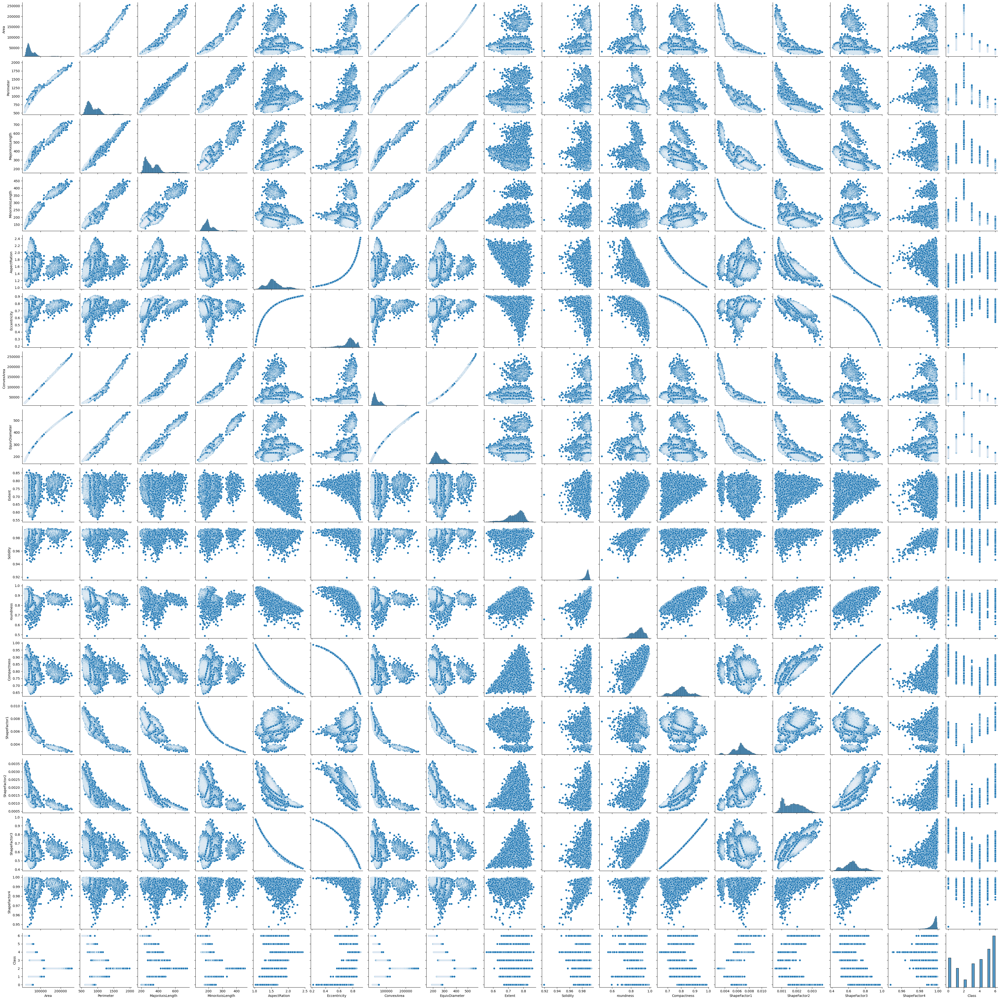

In [ ]:
sns.pairplot(data_viz_df)

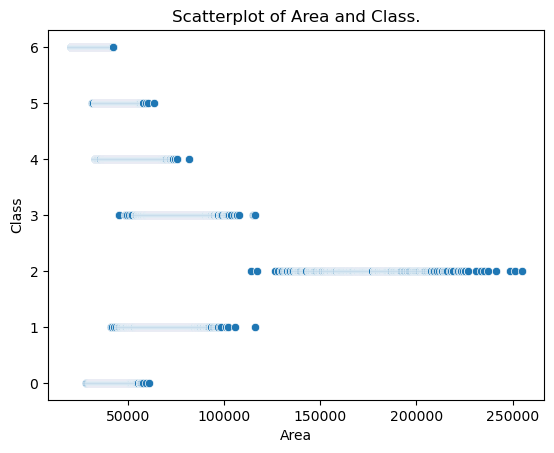

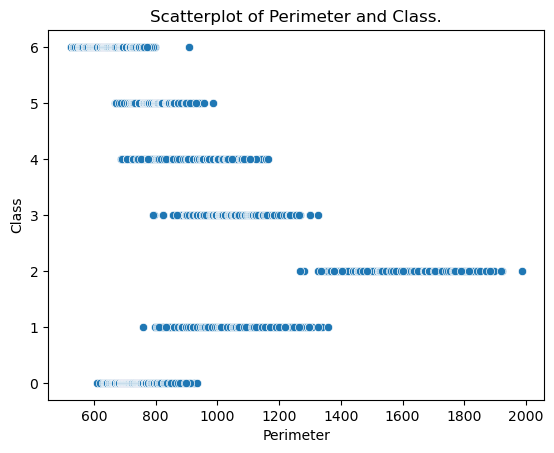

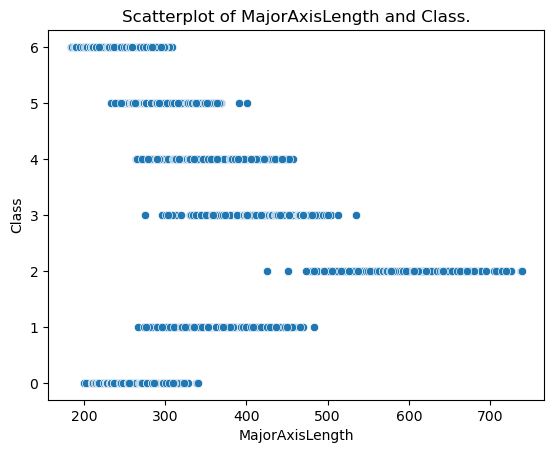

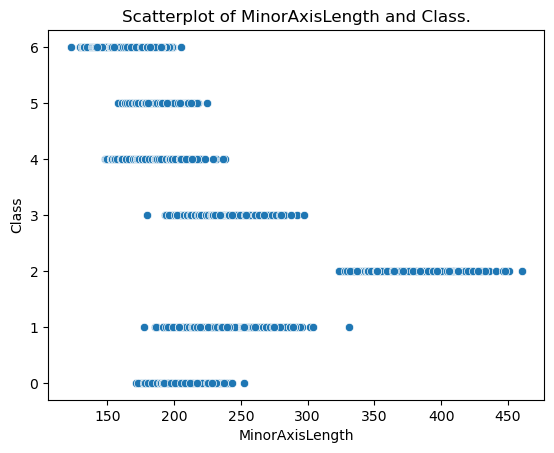

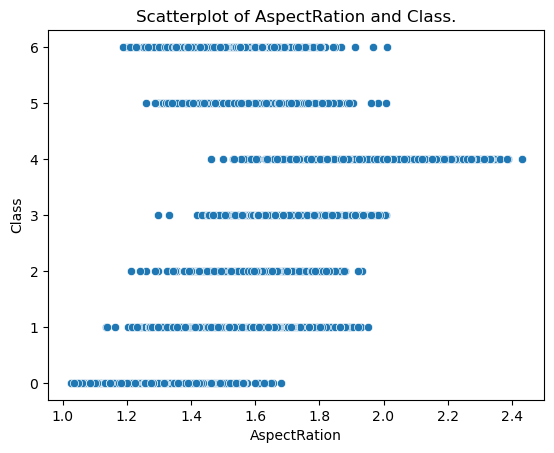

...

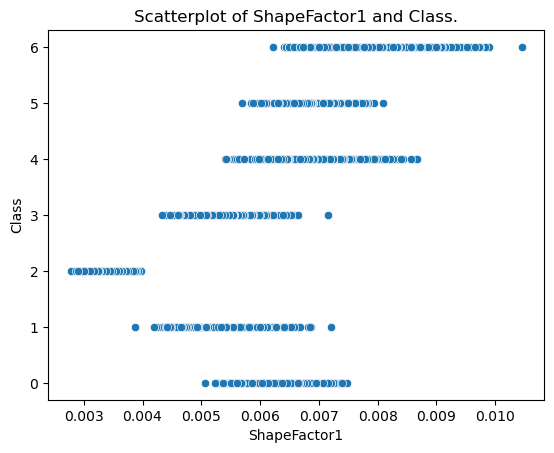

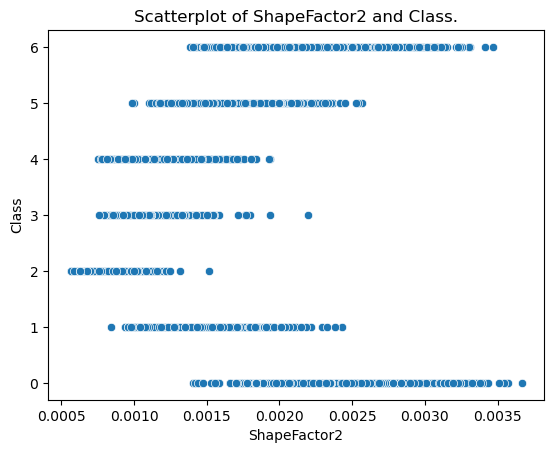

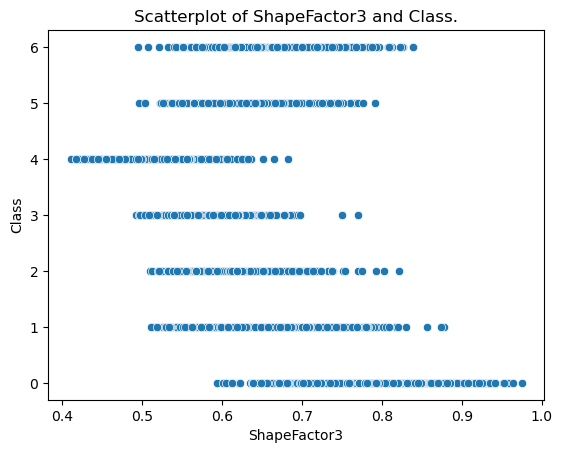

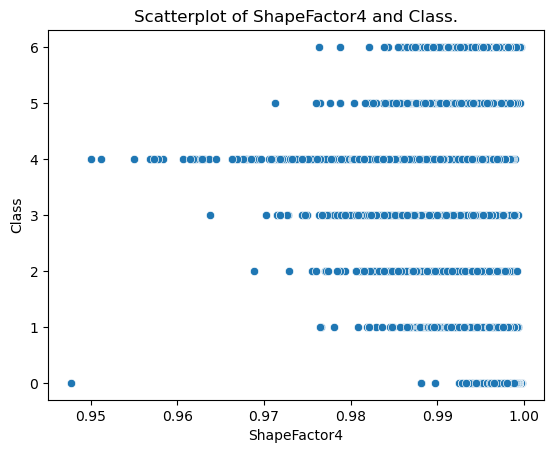

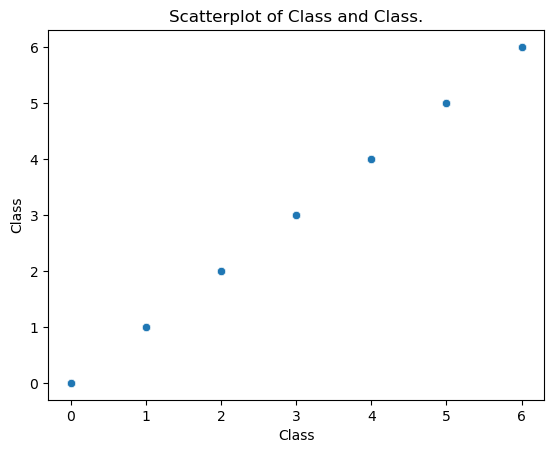

In [ ]:
def scatterplots(df) :  

    for i in df : 
        plt.title(f"Scatterplot of {i} and Class.")
        sns.scatterplot(x = i , y = 'Class' , data = df) 
        plt.show()

scatterplots(data_viz_df)

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')


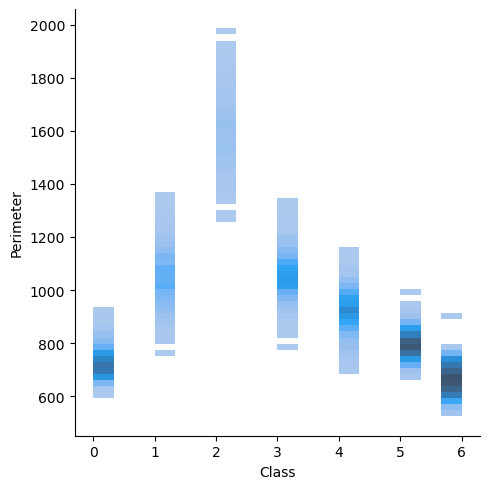

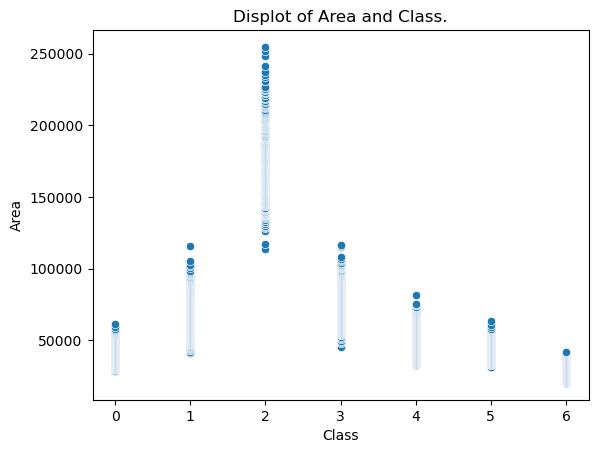

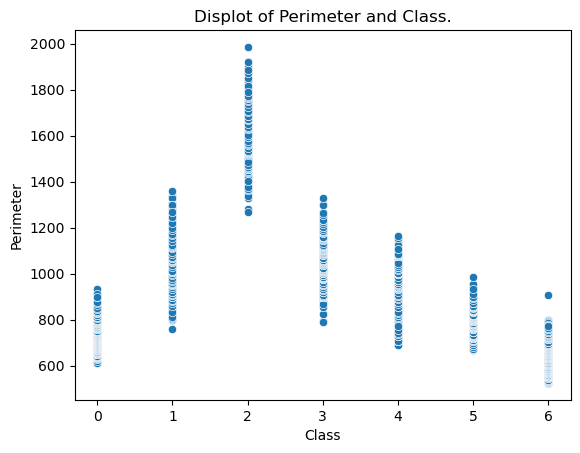

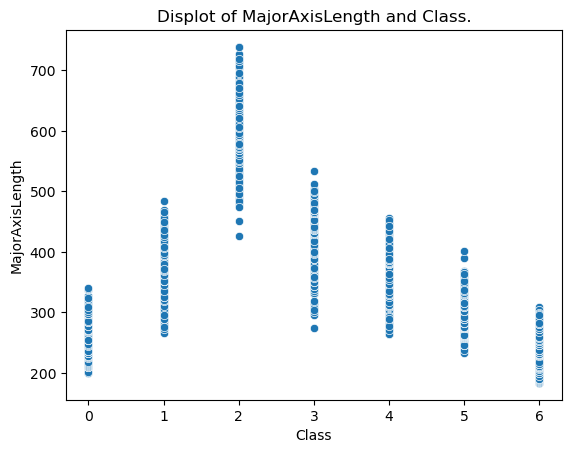

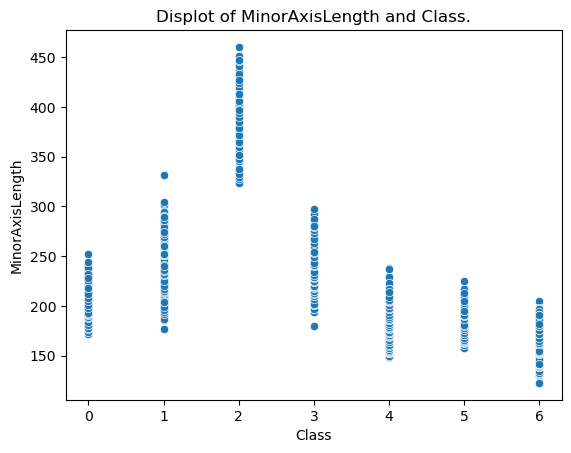

...

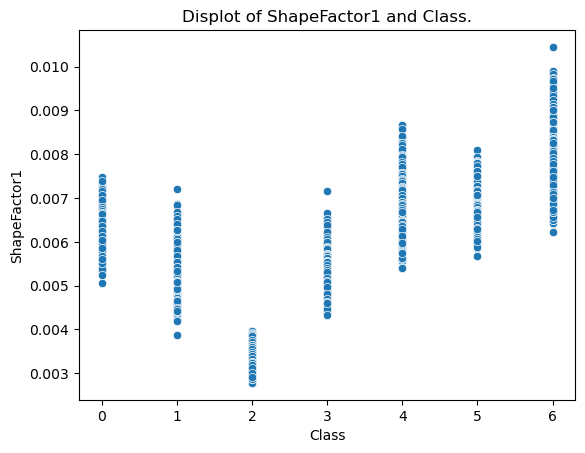

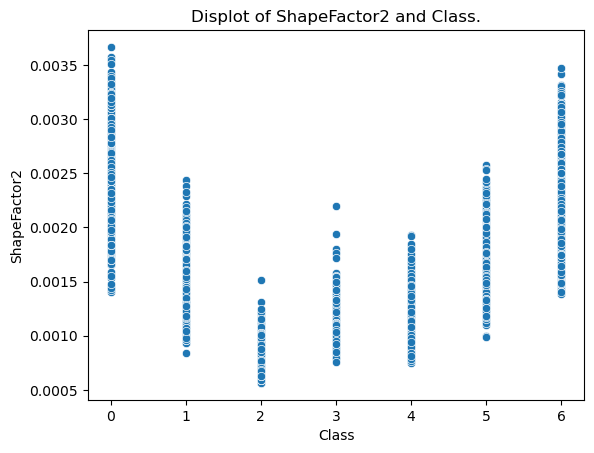

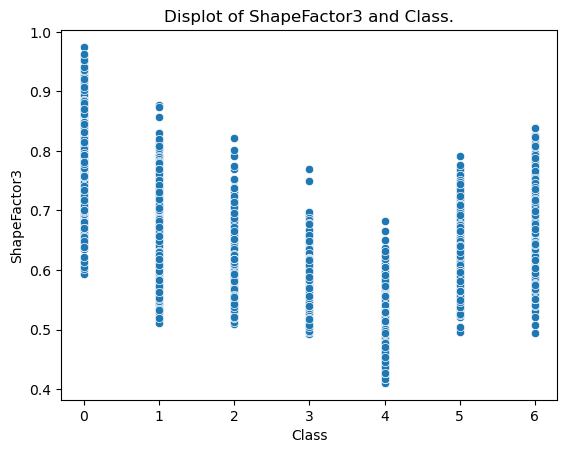

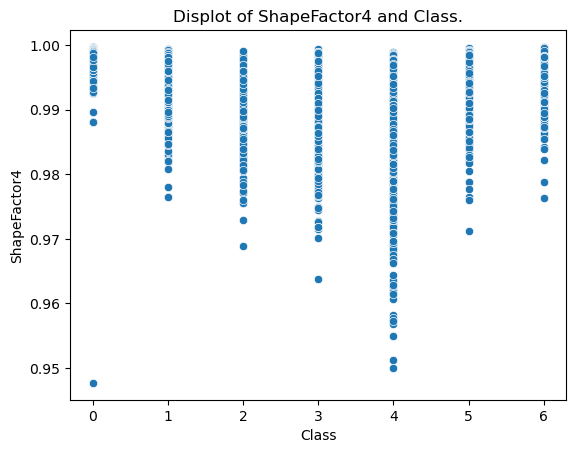

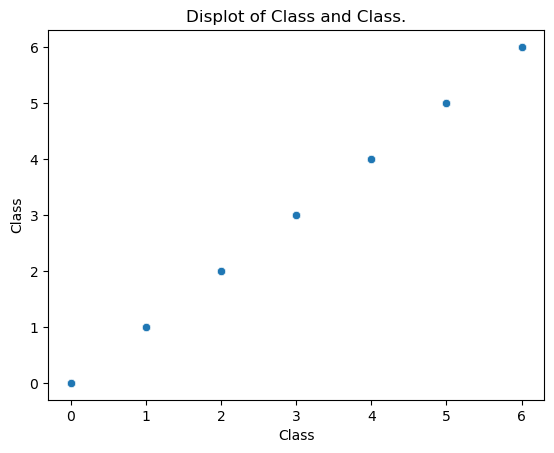

In [ ]:
def displots(df) :  

    for i in df : 
        plt.title(f"Displot of {i} and Class.")
        sns.scatterplot(x = 'Class' , y = i , data = df) 
        plt.show()

displots(data_viz_df)

In [ ]:
features = df.drop('Class' , axis = 1)
label = df['Class']

from sklearn.model_selection import train_test_split 

x_train , x_test , y_train , y_test = train_test_split(features , label , test_size = 0.25 , random_state = 32)
print(f"x train shape : {x_train.shape}\ny train shape : {y_train.shape}\nx test shape : {x_test.shape}\ny test shape : {y_test.shape}")

x train shape : (10208, 16)
y train shape : (10208,)
x test shape : (3403, 16)
y test shape : (3403,)


In [ ]:
from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier , AdaBoostClassifier , GradientBoostingClassifier 
from sklearn.svm import SVC 

from sklearn.pipeline import Pipeline 
from sklearn.preprocessing import StandardScaler 


lr_model = Pipeline([
    ('scaler' , StandardScaler()) , ('lr_model' , LogisticRegression())
                     ])

tree_model = Pipeline([
    ('scaler' , StandardScaler()) , ('tree' , DecisionTreeClassifier())
])

rf_model = Pipeline([
    ('scaler' , StandardScaler()) , ('rf_model' , RandomForestClassifier())
])

ada_model = Pipeline([
    ('scaler' , StandardScaler()) , ('ada_model' , AdaBoostClassifier())
])

gradient_model = Pipeline([
    ('scaler' , StandardScaler()) ,  ('gradient' , GradientBoostingClassifier())
])

svc_model = Pipeline([
    ('scaler' , StandardScaler()) , ('svc' , SVC())
])

In [ ]:
Model_Names = ['Logistic Regression' , 'Decision Tree Classifier' , 'Random Forest Classifier' , 'Adaboost Classifier', 'Gradientboosting Classifier' , 'Support Vector Classifier']
pipelines = [lr_model , tree_model , rf_model , ada_model , gradient_model , svc_model]



In [ ]:

for pipe in pipelines : 
    pipe.fit(x_train,y_train)


In [ ]:

# Comparing test Accuracies. 
    
for index,val in enumerate(pipelines) : 
    print(f"{pipelines[index]} , Test accuracy : {val.score(x_test , y_test)}")

Pipeline(steps=[('scaler', StandardScaler()),
                ('lr_model', LogisticRegression())]) , Test accuracy : 0.9230091096091684
Pipeline(steps=[('scaler', StandardScaler()),
                ('tree', DecisionTreeClassifier())]) , Test accuracy : 0.89920658242727
Pipeline(steps=[('scaler', StandardScaler()),
                ('rf_model', RandomForestClassifier())]) , Test accuracy : 0.9253599764913312
Pipeline(steps=[('scaler', StandardScaler()),
                ('ada_model', AdaBoostClassifier())]) , Test accuracy : 0.6194534234498972
Pipeline(steps=[('scaler', StandardScaler()),
                ('gradient', GradientBoostingClassifier())]) , Test accuracy : 0.9227152512488981
Pipeline(steps=[('scaler', StandardScaler()), ('svc', SVC())]) , Test accuracy : 0.9285924184543051


In [ ]:
print(lr_model.get_params().keys())

dict_keys(['memory', 'steps', 'verbose', 'scaler', 'lr_model', 'scaler__copy', 'scaler__with_mean', 'scaler__with_std', 'lr_model__C', 'lr_model__class_weight', 'lr_model__dual', 'lr_model__fit_intercept', 'lr_model__intercept_scaling', 'lr_model__l1_ratio', 'lr_model__max_iter', 'lr_model__multi_class', 'lr_model__n_jobs', 'lr_model__penalty', 'lr_model__random_state', 'lr_model__solver', 'lr_model__tol', 'lr_model__verbose', 'lr_model__warm_start'])


In [ ]:
from sklearn.model_selection import GridSearchCV 

param_grid = {
    'lr_model__penalty' : ['l1','l2','elasticnet'] , 
    'lr_model__C' : [1 , 5 , 10 , 15] , 
    'lr_model__solver' : ['lbfgs' , 'liblinear' , 'newton-cg','newton-cholesky' , 'sag','saga'] , 
    'lr_model__max_iter' : [50,100,200,300,500]
}

gs_model = GridSearchCV(lr_model , param_grid = param_grid , cv = 5 , scoring='accuracy')
gs_model.fit(x_train , y_train)
gs_model.best_params_

{'lr_model__C': 10,
 'lr_model__max_iter': 50,
 'lr_model__penalty': 'l2',
 'lr_model__solver': 'newton-cg'}

In [ ]:
y_pred_gs = gs_model.predict(x_test)

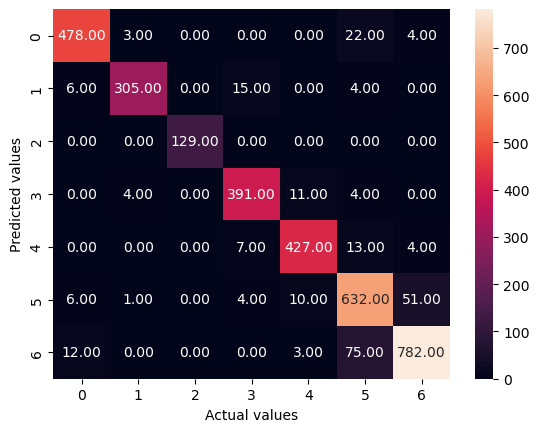

In [ ]:
from sklearn.metrics import confusion_matrix , classification_report ,accuracy_score

cm = confusion_matrix(y_test , y_pred_gs)
sns.heatmap(cm , annot = True , fmt = '0.2f')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.show()

In [ ]:
print(f"Classification Report : {classification_report(y_test , y_pred_gs)}")

Classification Report :               precision    recall  f1-score   support

           0       0.95      0.94      0.95       507
           1       0.97      0.92      0.95       330
           2       1.00      1.00      1.00       129
           3       0.94      0.95      0.95       410
           4       0.95      0.95      0.95       451
           5       0.84      0.90      0.87       704
           6       0.93      0.90      0.91       872

    accuracy                           0.92      3403
   macro avg       0.94      0.94      0.94      3403
weighted avg       0.93      0.92      0.92      3403



In [ ]:
score = accuracy_score(y_test , y_pred_gs)
score_perc = score * 100 
print(f"Accuracy Score : {score_perc:0.2f} %")

Accuracy Score : 92.39 %


In [ ]:
import pickle 

with open('../Streamlit Application/model.pkl' , 'wb') as file : 
    pickle.dump(gs_model , file)

